<a href="https://colab.research.google.com/github/blackmeadowAP/ArduinoGreenhouse/blob/main/cv2_contur_finder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import os
import cv2
import numpy as np
import imutils
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/CNN/roots'
print("Исходный путь к рабочей директории: ", os.getcwd())
os.chdir(path)
print("Новый путь к рабочей директории: ", os.getcwd())
from google.colab.patches import cv2_imshow

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Исходный путь к рабочей директории:  /content
Новый путь к рабочей директории:  /content/drive/MyDrive/CNN/roots


In [4]:
#отрисовка контуров на первичном сыром изображении
def image_contour(path):

  # Загрузка изображения
  image = cv2.imread(path)
  raw = image.copy()

  lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
  l, a, b = cv2.split(lab)

  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
  cl = clahe.apply(l)
  limg = cv2.merge((cl,a,b))
  final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

  # Преобразование изображения в оттенки серого
  gray = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
  #gray = cv2.GaussianBlur(gray, (5, 5), 0)
  # Применение бинаризации для выделения корней
  #edges = cv2.Canny(gray, 50, 150)
  _, thresh = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)


  # Поиск контуров на бинаризованном изображении

  #contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contours, _ = cv2.findContours(thresh, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
  # Создание копии изображения для рисования контуров на нем
  #contour_image = image.copy()
  contour_image = image.copy()

#отрисовка контура чашки на изображении, чтобы потом по нему создать маску
def image_petri_cnt(raw, cnts_petri):

  raw_new = cv2.drawContours(raw, [cnts_petri], -1, (0, 255, 0), 2)
  #cv2_imshow(raw_new)
  # создаём маску по контуру чашки петри
  mask = np.zeros(gray.shape,np.uint8)
  mask = cv2.drawContours(mask, [cnts_petri], -1, 255, cv2.FILLED)
  fg_masked = cv2.bitwise_and(raw_new, raw_new, mask=mask)

  # белый фон (используем инвертированную маску)
  mask = cv2.bitwise_not(mask)
  bk = np.full(raw_new.shape, 255, dtype=np.uint8)
  bk_masked = cv2.bitwise_and(bk, bk, mask=mask)

  # сливаем фон и передний план
  final = cv2.bitwise_or(fg_masked, bk_masked)
  return(final)

  # Нахождение площади каждого контура
  for contour in contours:
    area = cv2.contourArea(contour)
    #print("Площадь контура:", area, "пикселей")

  # Рисование контура на изображении
    cv2.drawContours(contour_image, [contour], -1, (0, 255, 0), 4)


  return(contour_image, contours, raw, gray)

#обрезает изображение по контуру чашки петри,после чего можно отрисовывать
#контуры внутри чашки(потенциально полезные)
def image_petri_cnt_cutter(final, path_cutted_petri):
  #код для разложения и обрезки изображения по маске контура круга чашки петри
  gray = cv2.cvtColor(final, cv2.COLOR_RGB2GRAY)
  thresh = cv2.threshold(gray, 195, 255, cv2.THRESH_BINARY)[1]
  thresh = cv2.bitwise_not(thresh)
  cnts_in_petri = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts_in_petri = imutils.grab_contours(cnts_in_petri)
  cnts_in_petri = sorted(cnts_in_petri, key=cv2.contourArea, reverse=True)[:10]

  # обработка каждого контура
  i = 0
  for c in cnts_in_petri:
    if cv2.contourArea(c) > 1000:

      # рисование маски, оставляем контур
      mask = np.zeros(gray.shape, np.uint8)
      mask = cv2.drawContours(mask, [c], -1, 255, cv2.FILLED)

      # белый фон
      fg_masked = cv2.bitwise_and(raw, raw, mask=mask)
      mask = cv2.bitwise_not(mask)
      bk = np.full(raw.shape, 255, dtype=np.uint8)
      bk_masked = cv2.bitwise_and(bk, bk, mask=mask)
      finalcont = cv2.bitwise_or(fg_masked, bk_masked)

      # ограничивающая область по контуру
      output = finalcont.copy()
      x,y,w,h = cv2.boundingRect(c)

      # вырезание области с чашкой
      roi = finalcont[y:y+h, x:x+w]

      #команда для изменения размера изображения если оно будет подаваться в нейросеть
      #roi = cv2.resize(roi, (400,400))

      # сохраняем картинку
      cv2.imwrite(path_cutted_petri, roi)
      cv2_imshow(roi)
      i += 1
      return(roi)

#удаляет контуры в заданном диапазоне, так как при первичной отрисовке контуров
#создается много шумов, мелких точечных контуров и слишком больших
def contur_cleaner(min_contur_area, max_contur_area, contours):

  #список для id контуров, которые будут удаляться
  d = []

  #отбор контуров по фильтрам для удаления
  for i, contour in enumerate(contours):
      area = cv2.contourArea(contour)
      if area <= min_contur_area or area >= max_contur_area:
        d.append(i)

  #удаление контуров из списка контуров
  cleaned_contours = np.delete(contours, d)


  return(cleaned_contours)

#принимает на вход массив контуров numpy и изображение для отрисовки
#возвращает изображение с отрисованными контурами
def contur_drawer(conturs, img):
  #отрисовка вычищенных контуров
  for contour in conturs:
      area = cv2.contourArea(contour)
    # Рисование контура на изображении
      cv2.drawContours(img, [contour], -1, (0, 255, 0), 4)

      #отрисовка изображения чашки с очищенными контурами
      #cv2_imshow(img)
      return(img)


In [ ]:
path = "/content/drive/MyDrive/CNN/roots/cut_petri.jpg"
contour_image, contours, raw, gray = image_contour(path)

#метод отрисовки изображений который поддерживается google cola b
cv2_imshow(contour_image)
cv2.imwrite("/content/drive/MyDrive/CNN/roots/img/cut_petri_ready.jpg", contour_image)

#отрисовка контура чашки
#сортировка списка контуров от самого большего к меньшему, чтобы достать
#второй по величине контур(первый самый большой контур это рамка фото)
#вторым по величине контуром является внешний контур чашки петри(если чашка вся помещена внутри фото)
cnts_petri = sorted(contours, key=cv2.contourArea, reverse=True)[1]

final = image_petri_cnt(raw, cnts_petri)
path_cutted_petri = "/content/drive/MyDrive/CNN/roots/cut_petri.jpg"
roi = image_petri_cnt_cutter(final, path_cutted_petri)

min_contur_area = 500
max_contur_area = 1500000

cleaned_contours = contur_cleaner(min_contur_area, max_contur_area, contours)
img = contur_drawer(cleaned_contours, raw)
cv2_imshow(img)

#отрисовка изображения с контуром чашки
cv2_imshow(final)

In [3]:
def image_contour_adaptive(path):

  # Загрузка изображения
  image = cv2.imread(path)
  raw = image.copy()

  lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
  l, a, b = cv2.split(lab)

  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
  cl = clahe.apply(l)
  limg = cv2.merge((cl,a,b))
  final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

  # Преобразование изображения в оттенки серого
  gray = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
  #gray = cv2.GaussianBlur(gray, (5, 5), 0)
  # Применение бинаризации для выделения корней
  #edges = cv2.Canny(gray, 50, 150)
  thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                 cv2.THRESH_BINARY_INV, 221, 5)
  #_, thresh = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)


  # Поиск контуров на бинаризованном изображении

  #contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contours, _ = cv2.findContours(thresh, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
  # Создание копии изображения для рисования контуров на нем
  #contour_image = image.copy()
  contour_image = image.copy()

# Нахождение площади каждого контура
  for contour in contours:
    area = cv2.contourArea(contour)
    #print("Площадь контура:", area, "пикселей")

  # Рисование контура на изображении
    cv2.drawContours(contour_image, [contour], -1, (0, 255, 0), 4)



  #for contour in contours:
       #area = cv2.contourArea(contour)
       #фильтрация шумов, мелкие контуры не отрисовываются
       #if area > 5 and area < 70:
       #x, y, width, height = cv2.boundingRect(contour)
        #cv2.rectangle(contour_image, (x, y), (x + width, y + height), (0, 255, 0), 2)
       #else:
        #del contour


  return(contour_image, contours, raw, gray)

In [4]:
path = "/content/drive/MyDrive/CNN/roots/cut_petri.jpg"
contour_image_a, contours_a, raw_a, gray_a = image_contour_adaptive(path)

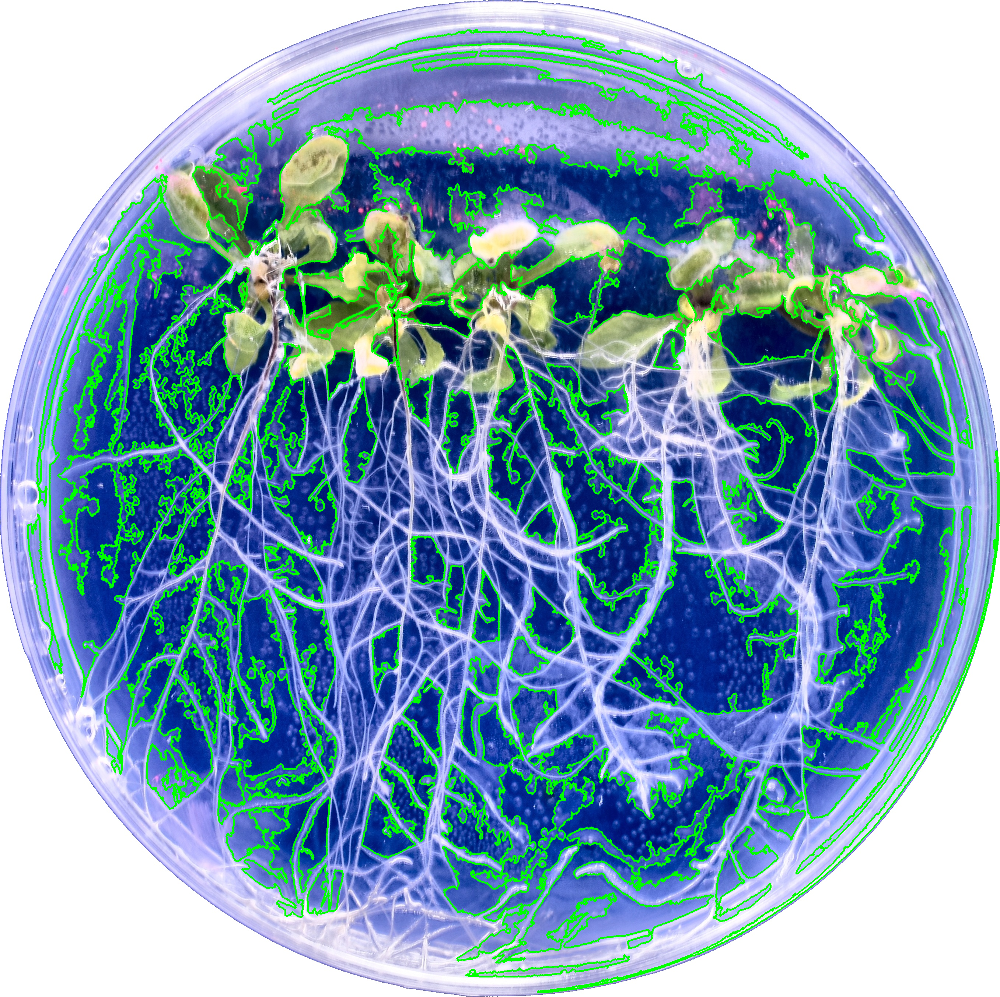

In [ ]:
d_a = []

for i, contour in enumerate(contours_a):
    area = cv2.contourArea(contour)
    if area <= 5000 or area >= 300000:
      d_a.append(i)


#print(d)

cleaned_contours_a = np.delete(contours_a, d_a)

for contour in cleaned_contours_a:
    area = cv2.contourArea(contour)
    #print("Площадь контура:", area, "пикселей")
    #cleaned_contur_raw = raw.copy()
  # Рисование контура на изображении
    cv2.drawContours(raw_a, [contour], -1, (0, 255, 0), 4)

cv2_imshow(raw_a)